In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
import os
import numpy as np
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
from PIL import Image

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Используем устройство: {device}')

Используем устройство: cuda


In [ ]:
data_train = 'C:/Users/Krugl/Desktop/ВКР/archive/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/'
data_valid = 'C:/Users/Krugl/Desktop/ВКР/archive/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid/'

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = datasets.ImageFolder(root=data_train, transform=transform)
val_dataset = datasets.ImageFolder(root=data_valid, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)

In [ ]:
model = models.resnet50(weights='IMAGENET1K_V1')

for param in model.parameters():
    param.requires_grad = False

num_features = model.fc.in_features
model.fc = nn.Linear(num_features, len(train_dataset.classes))

model = model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)


In [ ]:
train_loss_history = []
train_acc_history = []
val_loss_history = []
val_acc_history = []

In [ ]:
total_params = sum(p.numel() for p in model.parameters())
print(f"Всего параметров: {total_params / 1e6:.2f} млн")

Всего параметров: 23.59 млн


In [ ]:
num_epochs = 10

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        
        optimizer.zero_grad()
        
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
    
    train_loss = running_loss / len(train_loader)
    train_accuracy = 100 * correct / total
    train_loss_history.append(train_loss)
    train_acc_history.append(train_accuracy)
    
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    
    val_loss /= len(val_loader)
    val_accuracy = 100 * correct / total
    val_loss_history.append(val_loss)
    val_acc_history.append(val_accuracy)
    
    print(f"Эпоха {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Train Acc: {train_accuracy:.2f}%, Val Loss: {val_loss:.4f}, Val Acc: {val_accuracy:.2f}%")

torch.save(model.state_dict(), 'resnet_plant_disease_model.pth')

Эпоха 1/10, Train Loss: 0.4349, Train Acc: 89.80%, Val Loss: 0.2068, Val Acc: 93.61%
Эпоха 2/10, Train Loss: 0.1670, Train Acc: 94.99%, Val Loss: 0.1369, Val Acc: 95.82%
Эпоха 3/10, Train Loss: 0.1300, Train Acc: 95.90%, Val Loss: 0.1180, Val Acc: 96.08%
Эпоха 4/10, Train Loss: 0.1104, Train Acc: 96.45%, Val Loss: 0.1117, Val Acc: 96.33%
Эпоха 5/10, Train Loss: 0.0998, Train Acc: 96.73%, Val Loss: 0.1158, Val Acc: 95.94%
Эпоха 6/10, Train Loss: 0.0889, Train Acc: 97.09%, Val Loss: 0.1007, Val Acc: 96.69%
Эпоха 7/10, Train Loss: 0.0819, Train Acc: 97.25%, Val Loss: 0.0965, Val Acc: 96.76%
Эпоха 8/10, Train Loss: 0.0765, Train Acc: 97.45%, Val Loss: 0.1092, Val Acc: 96.30%
Эпоха 9/10, Train Loss: 0.0719, Train Acc: 97.59%, Val Loss: 0.0992, Val Acc: 96.59%
Эпоха 10/10, Train Loss: 0.0659, Train Acc: 97.79%, Val Loss: 0.0916, Val Acc: 96.80%


In [ ]:
model.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for inputs, labels in val_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, predicted = torch.max(outputs, 1)
        
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

print(classification_report(all_labels, all_preds, target_names=train_dataset.classes))

                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.98      0.96      0.97       504
                                 Apple___Black_rot       0.98      1.00      0.99       497
                          Apple___Cedar_apple_rust       1.00      0.94      0.97       440
                                   Apple___healthy       0.97      0.99      0.98       502
                               Blueberry___healthy       0.99      0.99      0.99       454
          Cherry_(including_sour)___Powdery_mildew       0.97      1.00      0.99       421
                 Cherry_(including_sour)___healthy       1.00      1.00      1.00       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.95      0.92      0.93       410
                       Corn_(maize)___Common_rust_       1.00      1.00      1.00       477
               Corn_(maize)___Northern_Leaf_Blight       0.92      0.96      0.

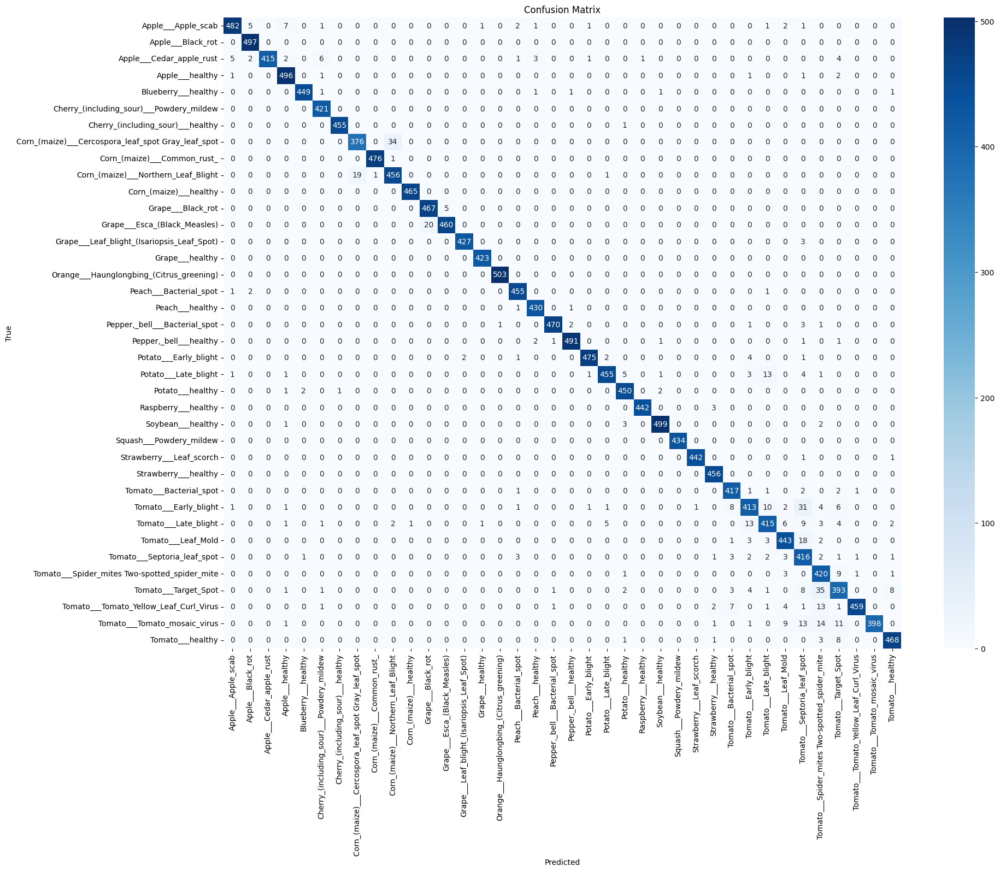

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=train_dataset.classes,
            yticklabels=train_dataset.classes)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()

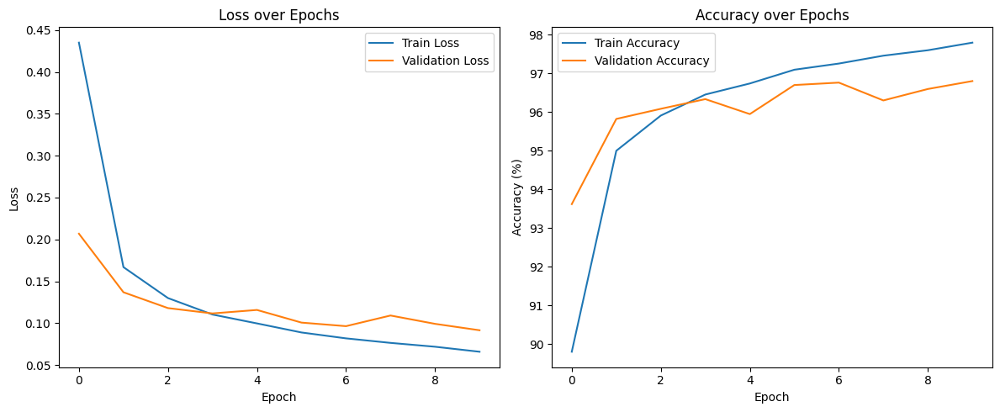

In [ ]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(train_loss_history, label='Train Loss')
plt.plot(val_loss_history, label='Validation Loss')
plt.title('Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_acc_history, label='Train Accuracy')
plt.plot(val_acc_history, label='Validation Accuracy')
plt.title('Accuracy over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.legend()

plt.tight_layout()
plt.show()

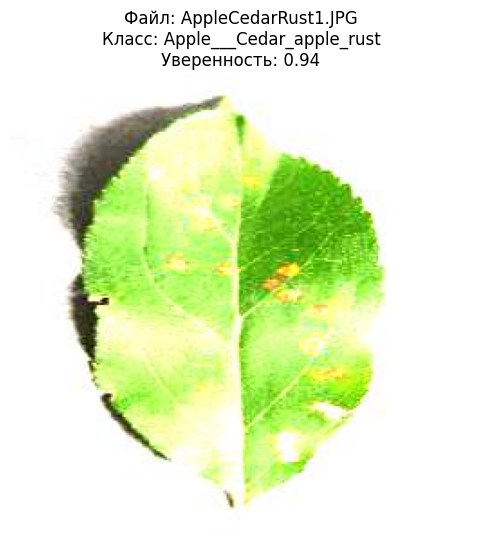

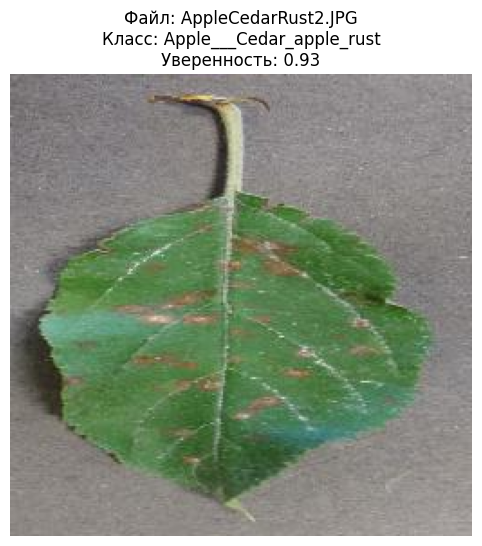

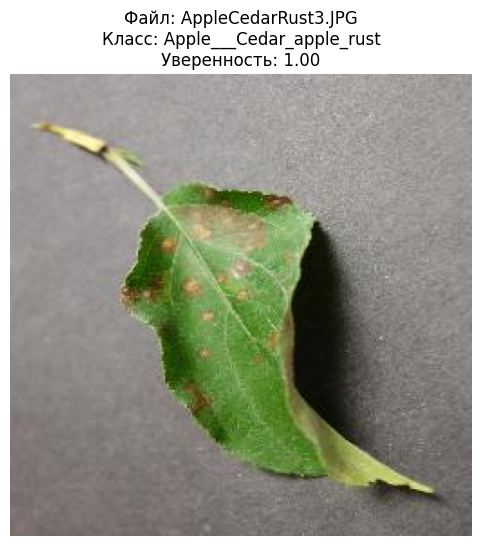

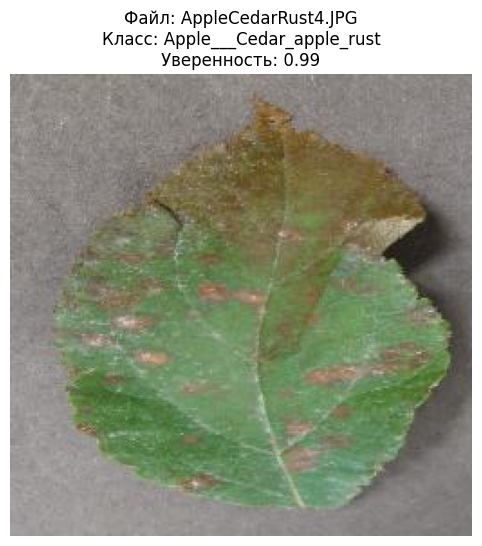

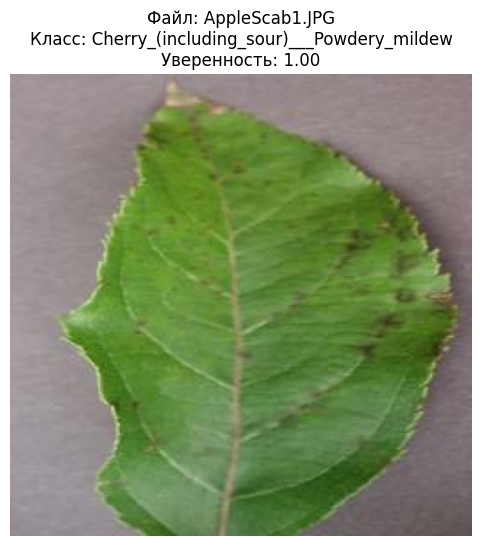

...

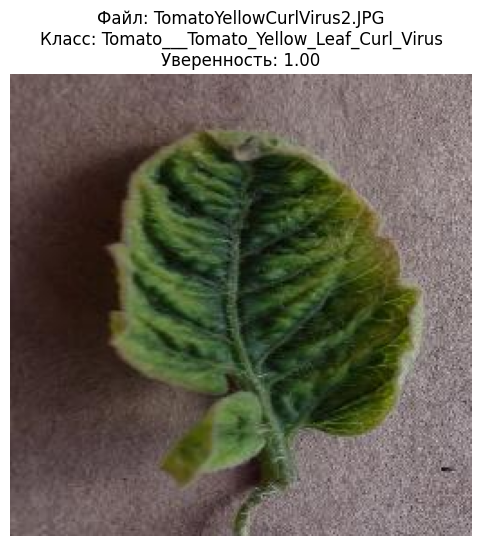

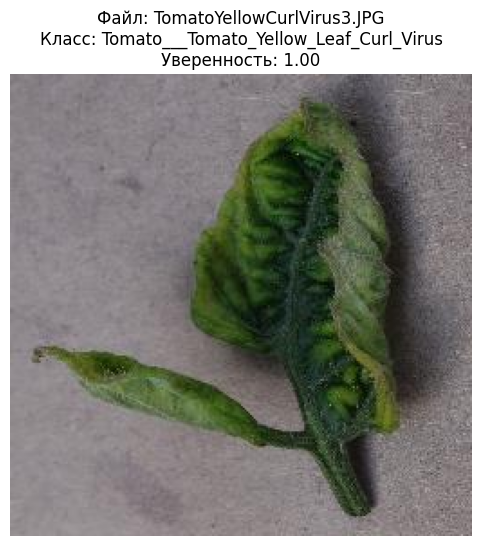

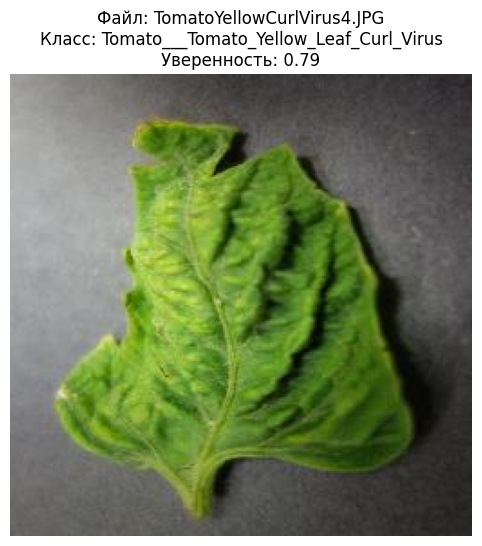

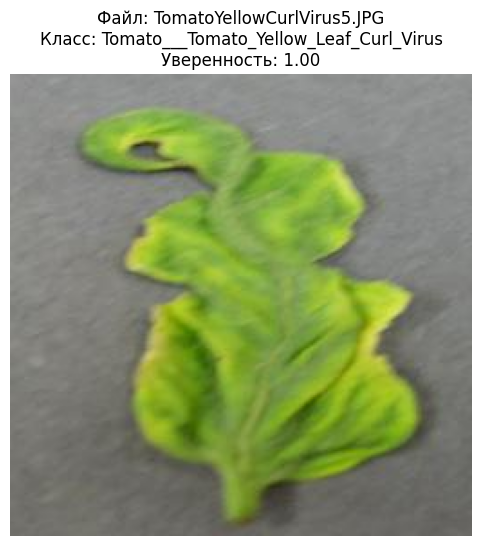

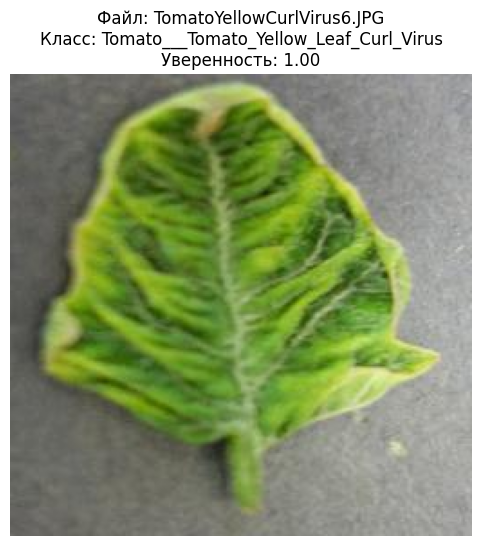

In [ ]:
test_dir = 'C:/Users/Krugl/Desktop/ВКР/archive/test/test'
test_images = [f for f in os.listdir(test_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
class_names = train_dataset.classes

if not test_images:
    print("В папке нет изображений!")
else:
    for img_name in test_images:
        img_path = os.path.join(test_dir, img_name)
        
        try:
            img = Image.open(img_path)
            img_tensor = transform(img).unsqueeze(0).to(device)
            
            model.eval()
            with torch.no_grad():
                output = model(img_tensor)
                probabilities = torch.nn.functional.softmax(output[0], dim=0)
                predicted_idx = torch.argmax(probabilities).item()
                predicted_class = class_names[predicted_idx]
                confidence = probabilities[predicted_idx].item()
            
            plt.figure(figsize=(8, 6))
            plt.imshow(img)
            plt.title(f"Файл: {img_name}\nКласс: {predicted_class}\nУверенность: {confidence:.2f}", fontsize=12)
            plt.axis('off')
            plt.show()
            
        except Exception as e:
            print(f"Ошибка при обработке {img_name}: {str(e)}")